**<h1>Problem Definition: Can we use one’s lifestyle to predict if they have a stroke?</h1>**

## **Importing necessary libraries**

---

In [ ]:
import numpy as np       # for basic math operations
import pandas as pd      # for dataframe manipulation
import seaborn as sb     # for data visualization

# EDA
from matplotlib import pyplot as plt                   # Used to display graphs
from imblearn.over_sampling import SMOTE               # Used for SMOTE   
from sklearn.model_selection import train_test_split   # To split train and test data from dataframe
# Decision Trees
from sklearn.metrics import confusion_matrix           # Print Confusion Matrix
from sklearn.tree import DecisionTreeClassifier        # For Decision Trees
from sklearn.tree import plot_tree                     # Print Decision Trees
from sklearn.ensemble import RandomForestClassifier    # For Random Forest Model
# Print Tree Models
from sklearn.tree import export_graphviz               # Export as Dot File
from subprocess import call                            # Convert to PNG
from IPython.display import Image                      # Display PNG in Notebook
# Hyperparameter Tuning
from sklearn.model_selection import RandomizedSearchCV # For Random Hyperparameter Search

import warnings 
warnings.filterwarnings("ignore")                     # Ignore warnings for cleaner results

## **First of all, let's import the dataset from github into the project:**

---

## **The dataset for stroke patients were taken from [here](https://www.kaggle.com/datasets/fedesoriano/stroke-prediction-dataset)**

## **Convert the CSV dataset into a dataframe for processing and analysis**

---

In [ ]:
url = 'https://raw.githubusercontent.com/NAIRBS/DSAI-PROJECT-GRP-8/main/healthcare-dataset-stroke-data.csv'

data = pd.read_csv(url, sep = ',')
df = pd.DataFrame(data)
df # Quick visualization of imported Dataframe

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
...,...,...,...,...,...,...,...,...,...,...,...,...
5105,18234,Female,80.0,1,0,Yes,Private,Urban,83.75,NaN,never smoked,0
5106,44873,Female,81.0,0,0,Yes,Self-employed,Urban,125.20,40.0,never smoked,0
5107,19723,Female,35.0,0,0,Yes,Self-employed,Rural,82.99,30.6,never smoked,0
5108,37544,Male,51.0,0,0,Yes,Private,Rural,166.29,25.6,formerly smoked,0


## **Let's briefly run over all the variables/attributes in our dataset**

---

In [ ]:
for col in df:
  print("Attribute:", col, "\n")                      # Print column name
  if len(df[col].unique()) < 100: # For only categorical attributes
    print("Unique categories are:\n")
    print(df[col].unique(), "\n")       # Show the unique categories
    print("Unique category counts are:\n")
    print(df[col].value_counts(ascending= True), "\n") # Show the amount of each unique category
    print("Number of empty rows in", col, "is: ", df[col].isnull().sum())
    print("---------------------------------------------------------------------")
  if len(df[col].unique()) > 100: # For only continuous attributes
    print("This is likely a continuous attribute.\n")
    print("Number of empty rows in", col, "is: ", df[col].isnull().sum())
    print("---------------------------------------------------------------------")


Attribute: id 

This is likely a continuous attribute.

Number of empty rows in id is:  0
---------------------------------------------------------------------
Attribute: gender 

Unique categories are:

['Male' 'Female' 'Other'] 

Unique category counts are:

Other        1
Male      2115
Female    2994
Name: gender, dtype: int64 

Number of empty rows in gender is:  0
---------------------------------------------------------------------
Attribute: age 

This is likely a continuous attribute.

Number of empty rows in age is:  0
---------------------------------------------------------------------
Attribute: hypertension 

Unique categories are:

[0 1] 

Unique category counts are:

1     498
0    4612
Name: hypertension, dtype: int64 

Number of empty rows in hypertension is:  0
---------------------------------------------------------------------
Attribute: heart_disease 

Unique categories are:

[1 0] 

Unique category counts are:

1     276
0    4834
Name: heart_disease, dtype: int

# **A quick breakdown of the features/atrributes in our dataset right now:**

---

# ***Attribute Information***
<ol>
<li><b>id:</b> unique identifier for each patient</li>

<li><b>gender:</b> "Male", "Female" or "Other"

<li><b>age:</b> age of the patient

<li><b>hypertension:</b> 0 if the patient doesn't have hypertension, 1 if the patient has hypertension

<li><b>heart_disease:</b> 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease

<li><b>ever_married:</b> "No" or "Yes"

<li><b>work_type:</b> "children", "Govt_jov", "Never_worked", "Private" or "Self-employed"

<li><b>Residence_type:</b> "Rural" or "Urban"

<li><b>avg_glucose_level:</b> average glucose level in blood

<li><b>bmi:</b> body mass index

<li><b>smoking_status:</b> "formerly smoked", "never smoked", "smokes" or "Unknown"*

<li><b>stroke:</b> 1 if the patient had a stroke or 0 if not
</ol>
<i><b><h5>Note: "Unknown" in smoking_status means that the information is unavailable for this patient</h5></b></i>

---



# **Data Preparation for future analysis and modelling**

## **Firstly, we removed the ID column as it is irrelevant to our problem statement**

---

In [ ]:
df = df.drop(['id'], axis = 1)

## **A quick look at the gender categories to show the number of each value again:**

---

In [ ]:
df["gender"].value_counts(ascending = True)

Other        1
Male      2115
Female    2994
Name: gender, dtype: int64

## **Removed the "other" gender (1) as it is not statistically significant**

---

In [ ]:
df = df[df.gender != "Other"] 

##**Check all attributes/features for null values:**

---

In [ ]:
df.isnull().sum()

gender                 0
age                    0
hypertension           0
heart_disease          0
ever_married           0
work_type              0
Residence_type         0
avg_glucose_level      0
bmi                  201
smoking_status         0
stroke                 0
dtype: int64

## **Removed the NULL values for bmi as 201/5110 = ~4% of data so its statistically insignificant**

---

In [ ]:
df.dropna(inplace=True) # Drop all NULL rows
df.isnull().sum() # Check again after dropping rows

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64

## **Rows after removing (1) "Others" gender and (201) "NULL" from bmi is 5110 - 1 - 201 = 4908.**

---

In [ ]:
df.count()

gender               4908
age                  4908
hypertension         4908
heart_disease        4908
ever_married         4908
work_type            4908
Residence_type       4908
avg_glucose_level    4908
bmi                  4908
smoking_status       4908
stroke               4908
dtype: int64

## **A quick look at the smoking_status categories to show the number of each value:**

---

In [ ]:
df["smoking_status"].value_counts(ascending= True)

smokes              737
formerly smoked     836
Unknown            1483
never smoked       1852
Name: smoking_status, dtype: int64

---

##**We decided NOT to remove the Unknown category as:**

**1. Unknown is statistically significant, 1483/4908 = ~30.2% of the data!**

**2. Unknown cannot be imputed with the most frequent data or the neighouring data as it is *Categorical*.**

**3. The Unknown itself is already a category and can be treated as its own unique value when doing binary classification prediction later.**

**[Reference on unknown value handling](https://medium.com/analytics-vidhya/ways-to-handle-categorical-column-missing-data-its-implementations-15dc4a56893)**

---

### **We decided to create another categorical variable that will be added to the dataframe, which sorted avg_glucose_level into 3 categories: Normal, Prediabetes and Diabetes**
#### **This was so that we would be able to more clearly tell if being diabetic has a relationship to stroke likelihood during our EDA later.**

---

# **[Diabetic Blood Sugar Levels](https://www.cdc.gov/diabetes/basics/getting-tested.html#:~:text=A%20fasting%20blood%20sugar%20level,higher%20indicates%20you%20have%20diabetes.)**
### **Normal Glucose range: <= 99 mg/dL**

### **Prediabetic Glucose range: > 99  mg/dL and < 126 mg/dL**

### **Diabetic Glucose range: >= 126 mg/dL**

In [ ]:
df['glucose_cat'] = df.loc[:, 'avg_glucose_level']

In [ ]:
def mapping(glucose):
    if glucose <= 99:
        return "Normal"
    if glucose >= 126:
        return "Diabetes"
    return "Prediabetes"
df["glucose_cat"] = df["glucose_cat"].map(mapping)
df["glucose_cat"].value_counts(ascending = True)

Diabetes        914
Prediabetes    1022
Normal         2972
Name: glucose_cat, dtype: int64

---
# ***Updated Attribute Information after Data Preparation***
<ol>

<li><b>gender:</b> "Male", "Female" <b>(Categorical)</b>

<li><b>age:</b> age of the patient <b>(Continuous)</b>

<li><b>hypertension:</b> 0 if the patient doesn't have hypertension, 1 if the patient has hypertension <b>(Categorical)</b>

<li><b>heart_disease:</b> 0 if the patient doesn't have any heart diseases, 1 if the patient has a heart disease <b>(Categorical)</b>

<li><b>ever_married:</b> "No" or "Yes" <b>(Categorical)</b>

<li><b>work_type:</b> "children", "Govt_jov", "Never_worked", "Private" or "Self-employed" <b>(Categorical)</b>

<li><b>Residence_type:</b> "Rural" or "Urban" <b>(Categorical)</b>

<li><b>avg_glucose_level:</b> average glucose level in blood <b>(Continuous)</b>

<li><b>glucose_cat:</b> "Normal" , "Prediabetes", "Diabetes" <b>(Categorical) | <i>newly added based off avg_glucose_level</i></b>

<li><b>bmi:</b> body mass index <b>(Continuous)</b>

<li><b>smoking_status:</b> "formerly smoked", "never smoked", "smokes" or "Unknown"*** <b>(Categorical)</b>

<li><b>stroke:</b> 1 if the patient had a stroke or 0 if not <b>(Categorical)</b>
</ol>
<i><b><h5>Note: "Unknown" in smoking_status means that the information is unavailable for this patient</h5></b></i>

---

# **Exploratory Data Analysis (EDA)**

## **EDA on continuous data: avg_glucose_level, bmi, age**
## **Create dataframe for easier processing**

---

In [ ]:
dfNumData = pd.DataFrame(df[['avg_glucose_level', 'bmi', 'age']])

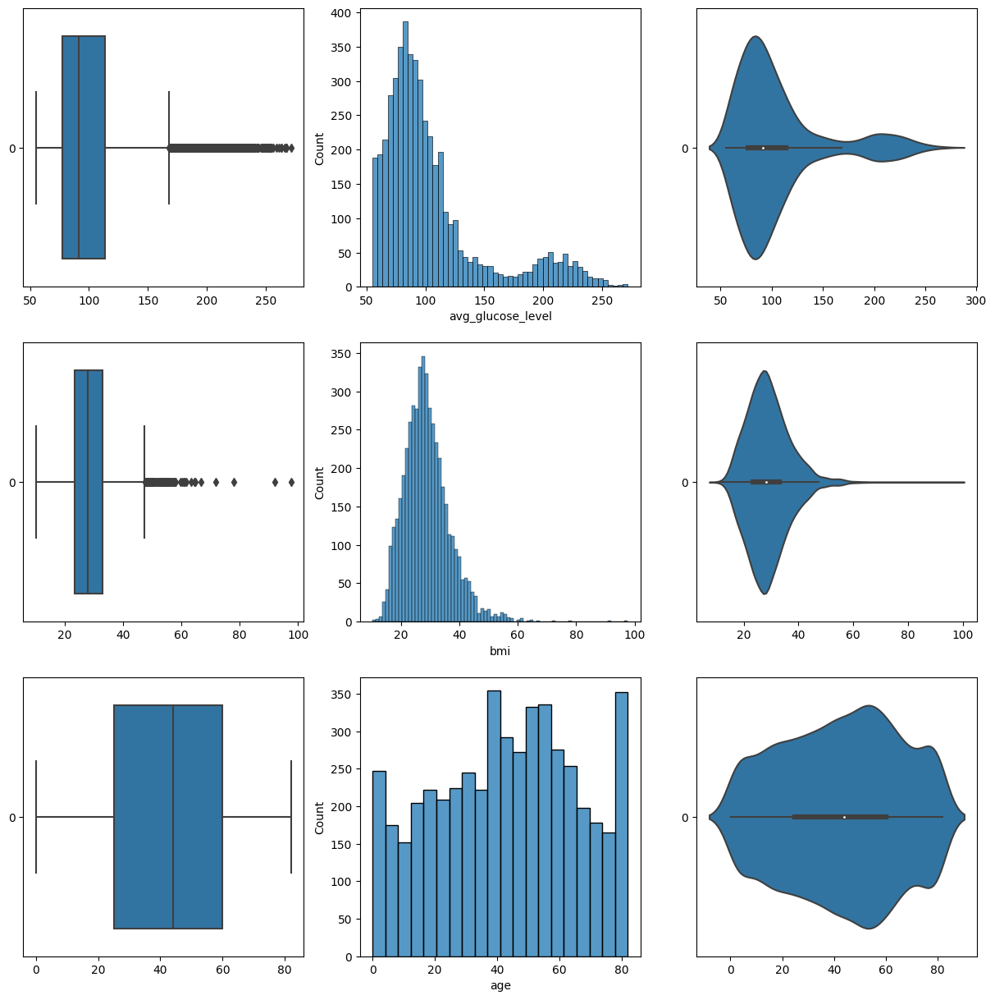

In [ ]:
f, axes = plt.subplots(3, 3, figsize=(15, 15))

count = 0
for var in dfNumData:
    sb.boxplot(data = dfNumData[var], orient = "h", ax = axes[count,0])
    sb.histplot(data = dfNumData[var], ax = axes[count,1])
    sb.violinplot(data = dfNumData[var], orient = "h", ax = axes[count,2])
    count += 1

## **Skewness of continuous data:**
### **avg_glucose_level and bmi is heavily positively skewed**

---

In [ ]:
# Compute the skewness
dfNumData.skew()

avg_glucose_level    1.614619
bmi                  1.055063
age                 -0.119450
dtype: float64

## **This shows that due to outliers, and as seen above in the violinplot:**

---

### **1. The majority of of avg_glucose level is ~90 to 100. (Normal Range)**

### **2. The majority of bmi is ~24 to 25. (Borderline Overweight)**

### **3. Age is skewed very little, showing that the dataset has a fair distribution of all ages.**

## **Let's try to find out how many outliers there are in the continuous data**

---

In [ ]:
# Calculate the quartiles
Q1 = dfNumData.quantile(0.25)
Q3 = dfNumData.quantile(0.75)

# Rule to identify outliers
rule = ((dfNumData < (Q1 - 1.5 * (Q3 - Q1))) | (dfNumData > (Q3 + 1.5 * (Q3 - Q1))))

# Count the number of outliers
rule.sum()

avg_glucose_level    569
bmi                  110
age                    0
dtype: int64

---
### <i>**Although there is a number of outliers in our data, we consider these outliers as true outliers.**
### **The nature of strokes is extreme so we shouldn't be so quick as to remove outliers.**
### **They represent natural variation in the population and should be kept in our dataset for now.**</i>

---

## **Distribution of the continuous data against stroke**

<Axes: xlabel='stroke', ylabel='age'>

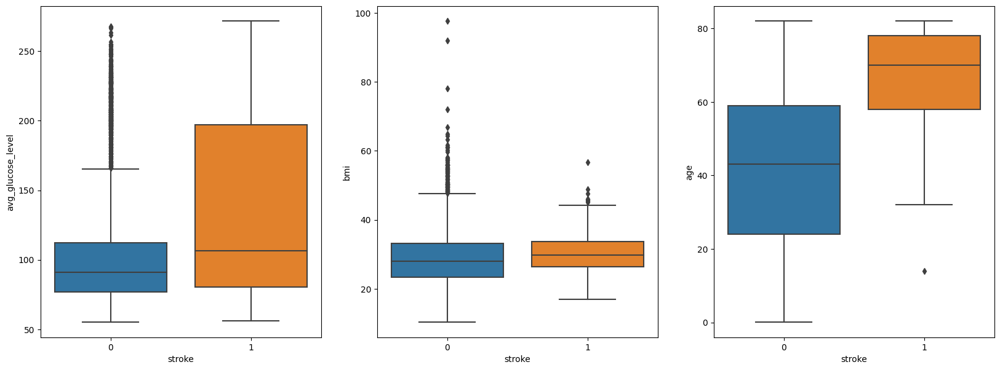

In [ ]:
f = plt.figure(figsize=(20, 7))
ax = plt.subplot(1, 3, 1)
sb.boxplot(y = 'avg_glucose_level', x = 'stroke', data = df)
ax = plt.subplot(1, 3, 2)
sb.boxplot(y = 'bmi', x = 'stroke', data = df)
ax = plt.subplot(1, 3, 3)
sb.boxplot(y = 'age', x = 'stroke', data = df)

## **We can clearly see that:**

---

### **1. Higher avg_glucose_level has a positive correlation with strokes.**
### **2. There might be a slight relationship between higher bmi and strokes as the variance is lower.**
### **3. Higher age or being older has a positive correlation with strokes.**


# **EDA on categorical data:**

---

### **1.gender**
### **2. hypertension**
### **3. heart_disease**
### **4. ever_married, work_type**
### **5. Residence_type**
### **6. smoking_status**
### **7. glucose_cat**

## **Countplot for the various categorical data**
### **Create dataframe to easier processing**

---

In [ ]:
dfCatData = pd.DataFrame(df[['gender','hypertension','heart_disease','ever_married','work_type','Residence_type','smoking_status','glucose_cat' ]])

<Axes: xlabel='glucose_cat', ylabel='count'>

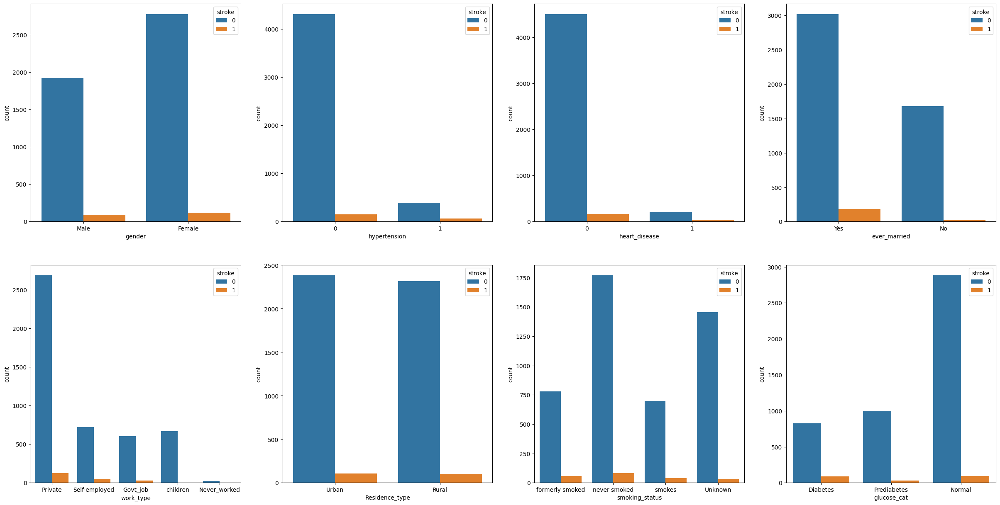

In [ ]:
fig, ax = plt.subplots(2, 4, figsize = (30, 15))

sb.countplot(data=df, x="gender", hue="stroke", ax= ax[0, 0])

sb.countplot(data=df, x="hypertension", hue="stroke", ax= ax[0, 1])

sb.countplot(data=df, x="heart_disease", hue="stroke", ax= ax[0, 2])

sb.countplot(data=df, x="ever_married", hue="stroke", ax= ax[0, 3])

sb.countplot(data=df, x="work_type", hue="stroke", ax= ax[1, 0])

sb.countplot(data=df, x="Residence_type", hue="stroke", ax= ax[1, 1])

sb.countplot(data=df, x="smoking_status", hue="stroke", ax= ax[1, 2])

sb.countplot(data=df, x="glucose_cat", hue="stroke", ax= ax[1, 3])

## **We can see that:**
---
##### **1. Slightly more females have strokes than males, although this could be attributed to the dataset having more female patient data.**
==============================================================================
##### **2. Less people with hypertension have had strokes, although this could be attributed to the dataset having much more non-hypertension patient data.**
==============================================================================
##### **3. Less people with heart disease have had strokes, although this could be attributed to the dataset having much more non-heart disease patient data.**
==============================================================================
##### **4. More people who are married have had strokes, although this could be attributed to the dataset having more married patient data.**
==============================================================================
##### **5. More people who are working in the private sector have had strokes, although this could be attributed to the dataset having much more private sector working patient data.**
==============================================================================
##### **6. A near equal amount of people have had strokes whether they live in urban or rural environments.**
==============================================================================
##### **7. More people who have never smoked have had strokes, although this could be attributed to the dataset having more non-smoking patient data.**
==============================================================================
##### **8. More people who have normal levels of blood sugar have had strokes, although this could be attributed to the dataset having more normal blood sugar level patient data.**
==============================================================================




# ***EDA Conclusion:***
---
### **1. Our dataset is heavily unbalanced and does not have enough data about actual patients who have gotten strokes as non-stroke data populates most of the dataset.**
### **2. Since our dataset is so heavily unbalanced that we cannot do any feature selection other than Residence_Type as we cannot tell what features can help in predicting strokes just from EDA...**
### **3. We have to make use of all features going forward (excluding Patient ID and Residence_Type) since they are shown to be slightly related to stroke likelihood.**
---


# **Machine Learning for Binary Classification in predicting Strokes**

## **Model Preparation for Machine Learning Techniques**
---
### **Encoding catogorical data from string format into integer format so that it can be used in following models.**

*   **Gender** becomes 0 (Female) and 1 (Male)
*   **ever_married** becomes 0 (No) and 1 (Yes)
*   **work_type** becomes 0 (children), 1 (Private), 2 (Self-Employed), 3 (Govt_job), 4 (Never_worked)
*   **Residence_type** becomes 0 (Rural), 1 (Urban)
*   **smoking_status** becomes 0 (never smoked), 1 (formerly smoked), 2 (smokes), 3 (Unknown)
*   **glucose_cat** becomes 0 (Normal), 1 (Prediabetes), 2 (Diabetes)

---

In [ ]:
# make a new dataframe without changing the original
new_df=pd.DataFrame.copy(df)
new_df.gender[new_df.gender == 'Male'] = 1
new_df.gender[new_df.gender == 'Female'] = 0
new_df.ever_married[new_df.ever_married == 'Yes'] = 1
new_df.ever_married[new_df.ever_married == 'No'] = 0
new_df.work_type[new_df.work_type == 'children'] = 0
new_df.work_type[new_df.work_type == 'Private'] = 1
new_df.work_type[new_df.work_type == 'Self-employed'] = 2
new_df.work_type[new_df.work_type == 'Govt_job'] = 3
new_df.work_type[new_df.work_type == 'Never_worked'] = 4
new_df.Residence_type[new_df.Residence_type == 'Urban'] = 1
new_df.Residence_type[new_df.Residence_type == 'Rural'] = 0
new_df.smoking_status[new_df.smoking_status == 'never smoked'] = 0
new_df.smoking_status[new_df.smoking_status == 'formerly smoked'] = 1
new_df.smoking_status[new_df.smoking_status == 'smokes'] = 2
new_df.smoking_status[new_df.smoking_status == 'Unknown'] = 3
new_df.glucose_cat[new_df.glucose_cat == 'Normal'] = 0
new_df.glucose_cat[new_df.glucose_cat == 'Prediabetes'] = 1
new_df.glucose_cat[new_df.glucose_cat == 'Diabetes'] = 2
# new_df is the new dataframe with only numerical data

## **Holdout cross validation: Split data into independant variables (*X*) and dependant variables (*y*)** 

### ***X* will be independent variables, all other variables in the dataframe**

### ***y* will be dependent variables, the column titled "stroke"**

### ***We will also be excluding Residence_Type as it has shown to not have much of relationship with stroke likelihood***

---

In [ ]:
y = pd.DataFrame(new_df["stroke"])
X = pd.DataFrame(new_df[["gender", "age", "hypertension", "heart_disease", "ever_married", "work_type", "avg_glucose_level", "bmi", "smoking_status", "glucose_cat"]])

## **Splitting dataframe into train and test for machine learning.**
#### **1. Train test split (80:20)**
#### **2. random_state was chosen since we noticed that the patients who suffered from a stroke are grouped at the top. If we did not use random_state, the function will pick data from the top and which will cause biasness in model training.**
#### **3. The number 42 for random_state is a random number that we picked but will be used throughout whenever we employ train_test_split for consistency.**

---

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=42)


## **Our data is unbalanced as there is very little recorded cases where patients had a stroke compared to those who do not (4699:209 for entire data set)**

---

In [ ]:
df["stroke"].value_counts()

0    4699
1     209
Name: stroke, dtype: int64

## **Therefore, we will attempt to balance our *train* data with [SMOTE](https://www.analyticsvidhya.com/blog/2020/10/overcoming-class-imbalance-using-smote-techniques/) (Synthetic Minority Over-sampling Technique).**

---

In [ ]:
oversample = SMOTE()
X_train_resh, y_train_resh = oversample.fit_resample(X_train, np.ravel(y_train))

## **Check that the SMOTE has worked properly.**

---

In [ ]:
X_train_resh.shape, y_train_resh.shape # 7540 rows, 10 columns (features), 7540 rows, 1 column (since predictor only has stroke feature)

((7540, 10), (7540,))

## **Binary Class distribution in train data is 1:1 (Equal amount of Stroke to Non-Stroke data)**

---
 

In [ ]:
np.bincount(y_train_resh)

array([3770, 3770])

# **Helper function to print out classification model accuracy results:**

---

In [ ]:
def print_results(clf, X_train, y_train, X_test, y_test, confusionTrain, confusionTest):
  
  # Check the Goodness of Fit (on Train Data)
  print("Goodness of Fit of Model \tTrain Dataset")
  print(f'Classification Accuracy \t: {clf.score(X_train, y_train):.3f} \n')
  # True Positive Rate ( TP / (TP + FN) )
  print(f'True Positive Rate \t\t: {confusionTrain[1,1] / (confusionTrain[1,1] + confusionTrain[1,0]):.3f}')
  # False Negative Rate ( FN / (FN + TP) )
  print(f'False Negative Rate \t\t: {1 - (confusionTrain[1,1] / (confusionTrain[1,1] + confusionTrain[1,0])):.3f}\n')
  # True Negative Rate ( TN / (TN + FP) )
  print(f'True Negative Rate \t\t: {confusionTrain[0,0] / (confusionTrain[0,0] + confusionTrain[0,1]):.3f} ')
  # False Positive Rate ( FP / (FP + TN) )
  print(f'False Positive Rate \t\t: {1- (confusionTrain[0,0] / (confusionTrain[0,0] + confusionTrain[0,1])):.3f}\n')

  # Print Seperating Line
  print("------------------------------------------------------------------------------------------------------------------------")

  # Check the Goodness of Fit (on Test Data)
  print("Goodness of Fit of Model \tTest Dataset")
  print(f'Classification Accuracy \t: {clf.score(X_test, y_test):.3f} \n')

  # True Positive Rate ( TP / (TP + FN) )
  print(f'True Positive Rate \t\t: {confusionTest[1,1] / (confusionTest[1,1] + confusionTest[1,0]):.3f}')
      # False Negative Rate ( FN / (FN + TP) )
  print(f'False Negative Rate \t\t: {1 - (confusionTest[1,1] / (confusionTest[1,1] + confusionTest[1,0])):.3f} \n')
  # True Negative Rate ( TN / (TN + FP) )
  print(f'True Negative Rate \t\t: {confusionTest[0,0] / (confusionTest[0,0] + confusionTest[0,1]):.3f} ')
  # False Positive Rate ( FP / (FP + TN) )
  print(f'False Positive Rate \t\t: {1 - (confusionTest[0,0] / (confusionTest[0,0] + confusionTest[0,1])):.3f}\n')

  # Print the confusion matrix and the title of the matrix
  plt.figure(figsize=(20, 5))
  ax = plt.subplot(1, 2, 1)
  plt.title('Train Dataset')
  sb.heatmap(confusionTrain, annot = True, fmt=".0f", cbar=False, annot_kws={"size": 18})

  ax = plt.subplot(1, 2, 2)
  plt.title('Test Dataset')
  sb.heatmap(confusionTest, annot = True, fmt=".0f", cbar=False, annot_kws={"size": 18})
  return

#**Decision Tree Classification Model (With SMOTE)**

---

### **1. Binary classification trees requires all data to be in integer form. Changing of certain data columns from string to categorical data in numerical form done above.**
### **2. We used a max_depth of 20 as we found that any additional depth results in overfitting and diminishing returns in terms of test accuracy.**
---

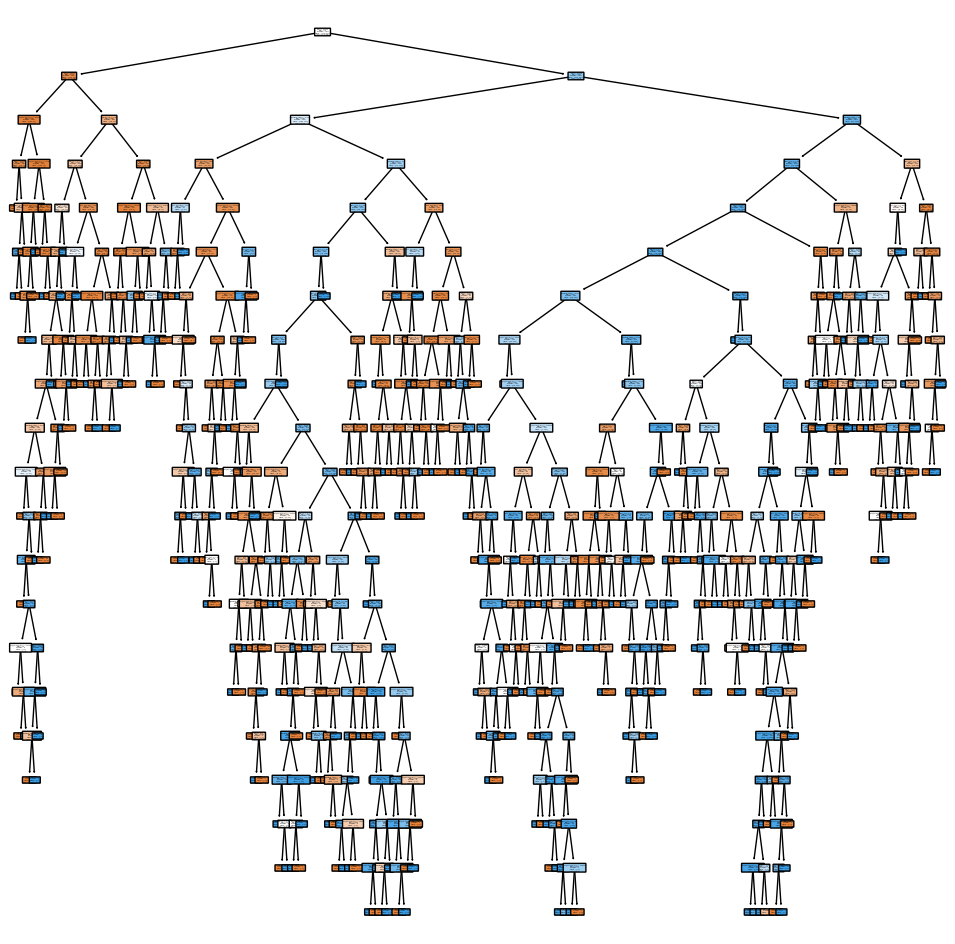

In [ ]:
# Decision Tree using Train Data
dectree = DecisionTreeClassifier(max_depth = 20)  # create the decision tree object
dectree.fit(X_train_resh, y_train_resh)          # train the decision tree model

f = plt.figure(figsize=(12,12))
plot_tree(dectree, filled=True, rounded=True, 
          feature_names=X_train_resh.columns, 
          class_names=["No Stroke","Stroke"])

plt.show() #Show the decision tree and suppress node output

# **Print out accuracy of model:**
---

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.999 

True Positive Rate 		: 1.000
False Negative Rate 		: 0.000

True Negative Rate 		: 0.999 
False Positive Rate 		: 0.001

------------------------------------------------------------------------------------------------------------------------
Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.883 

True Positive Rate 		: 0.170
False Negative Rate 		: 0.830 

True Negative Rate 		: 0.924 
False Positive Rate 		: 0.076



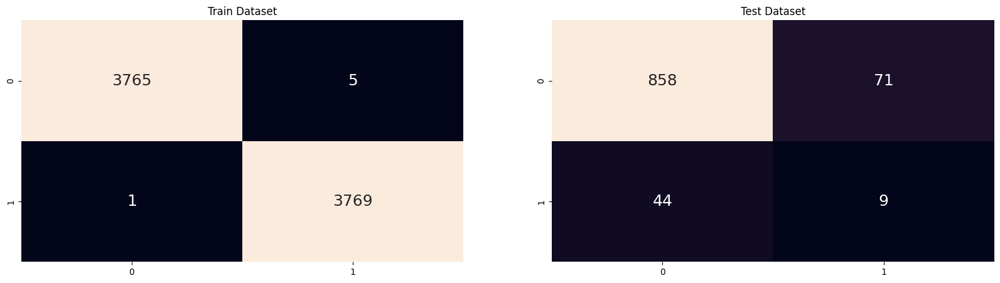

In [ ]:
y_train_pred_binary = dectree.predict(X_train_resh) #use binary tree to predict
y_test_pred = dectree.predict(X_test) 

BinaryConfusionTrain = confusion_matrix(y_train_resh, y_train_pred_binary) #compare actual train y against predicted values
BinaryConfusionTest = confusion_matrix(y_test, y_test_pred) #compare actual test y against predicted values 

print_results(dectree, X_train_resh, y_train_resh, X_test, y_test, BinaryConfusionTrain, BinaryConfusionTest)

<b><h1>Random Forest Binary Classification Model (with SMOTE)</h1></b>
### **1. Random Forests are a ensemble tool that creates multiple decision trees and pits that against each other to create more stable and accurate predictions.**
### **2. Random Forests creates trees at *random* which reduces overfitting unlike a single decision tree.**
### **3. As multiple trees are used instead of just one, they allow for better binary classification accuracy.**

## **Print out accuracy of model:**
---

Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 1.000 

True Positive Rate 		: 1.000
False Negative Rate 		: 0.000

True Negative Rate 		: 1.000 
False Positive Rate 		: 0.000

------------------------------------------------------------------------------------------------------------------------
Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.925 

True Positive Rate 		: 0.000
False Negative Rate 		: 1.000 

True Negative Rate 		: 0.977 
False Positive Rate 		: 0.023



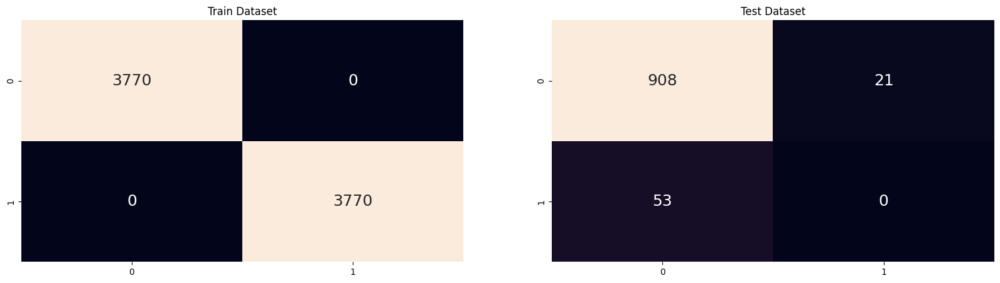

In [ ]:
clf = RandomForestClassifier(n_estimators=1000,random_state=0)
clf.fit(X_train_resh, y_train_resh)

y_train_pred = clf.predict(X_train_resh)
y_pred = clf.predict(X_test)

confusciousTrain = confusion_matrix(y_train_resh, y_train_pred)
confusciousTest = confusion_matrix(y_test, y_pred)

print_results(clf, X_train_resh, y_train_resh, X_test, y_test, confusciousTrain, confusciousTest)

# **Print out Random Forest Tree:**

In [ ]:
estimator = clf.estimators_[5]

# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_train.columns,
                class_names = ["No Stroke","Stroke"],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
display(Image(filename = 'tree.png')) #prints out GIGANTIC tree, DO NOT COMMENT UNTIL YOU WANT TO SEE GRAPH

# **Hyperparameter Tuning with RandomSearchCV (With SMOTE)**

In [ ]:
param_grid = {
    'n_estimators': [25, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550, 600, 650, 700, 750, 800, 850, 900, 950, 1000],
    'criterion': ['gini', 'entropy', 'log_loss'],
    'max_depth': list(range(10, 100)),
    'max_features': ['sqrt', 'log2', None],
    'max_leaf_nodes': list(range(10,100)),
} # Default Hyperparameters taken from RandomForest Documentation

random_search = RandomizedSearchCV(clf, param_grid, cv=10, n_jobs=-1)
random_search.fit(X_train_resh, y_train_resh)
print(random_search.best_estimator_)

RandomForestClassifier(criterion='entropy', max_depth=83, max_features=None,
                       max_leaf_nodes=86, n_estimators=150, random_state=0)


Goodness of Fit of Model 	Train Dataset
Classification Accuracy 	: 0.979 

True Positive Rate 		: 0.968
False Negative Rate 		: 0.032

True Negative Rate 		: 0.989 
False Positive Rate 		: 0.011

------------------------------------------------------------------------------------------------------------------------
Goodness of Fit of Model 	Test Dataset
Classification Accuracy 	: 0.923 

True Positive Rate 		: 0.019
False Negative Rate 		: 0.981 

True Negative Rate 		: 0.974 
False Positive Rate 		: 0.026



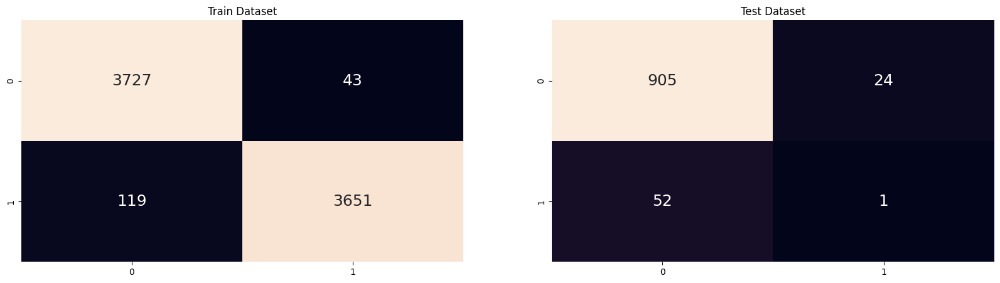

In [ ]:
clf2 = RandomForestClassifier(criterion='entropy', max_depth=83, max_features=None,
                       max_leaf_nodes=86, n_estimators=150, random_state=0)

clf2.fit(X_train_resh, y_train_resh)
y_pred = clf2.predict(X_test)
y_train_pred = clf2.predict(X_train_resh)

confusciousTrain = confusion_matrix(y_train_resh, y_train_pred)
confusciousTest = confusion_matrix(y_test, y_pred)

print_results(clf2, X_train_resh, y_train_resh, X_test, y_test, confusciousTrain,confusciousTest)

# **References:**
---
## **Dataset Used:**
https://www.kaggle.com/datasets/fedesoriano/stroke-prediction-dataset
---
## **EDA:**
---
### **Diabetic Blood Sugar Levels:** 
**https://www.cdc.gov/diabetes/basics/getting-tested.html#:~:text=A%20fasting%20blood%20sugar%20level,higher%20indicates%20you%20have%20diabetes.**

### **How to handle unknown categorical data:**
**https://medium.com/analytics-vidhya/ways-to-handle-categorical-column-missing-data-its-implementations-15dc4a56893**

### **Hold out cross validation:**
**https://www.mygreatlearning.com/blog/cross-validation/**

### **How we identify outliers:**
**https://www.pluralsight.com/guides/cleaning-up-data-from-outliers**

### **SMOTE:**
#### **https://www.analyticsvidhya.com/blog/2020/10/overcoming-class-imbalance-using-smote-techniques/**
---

##**Decision Tree:**
---
### **https://scikit-learn.org/stable/modules/tree.html**
---

##**Random Forests:**
---
### **https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html**


### **Tuning Hyperparameters:**
#### **https://www.geeksforgeeks.org/random-forest-hyperparameter-tuning-in-python/**
---